# RFM CUSTOMER ANALYSIS

## Table of Contents : 
* Business Problem
* Libraries
* Loading Data
* Data Preprocessing - EDA
    * Missing Values
    * Outliers
    * Exploring Features
        * Invoice
        * StockCode
        * Description
        * Quantity
        * InvoiceDate
        * UnitPrice
        * CustomerID
        * Country
* RFM Analysis
    * Recency
    * Frequency
    * Monetary
    * Scoring R-F-M values
    * Customer Segmentetion

## Business Problem 


Bir e-ticaret şirketi müşterilerini segmentlere ayırıp bu segmentlere göre pazarlama stratejileri belirlemek istiyor.

Buna yönelik olarak müşterilerin davranışlarını tanımlayacağız ve bu davranışlarda öbeklenmelere göre gruplar oluşturacağız.

Yani ortak davranışlar sergileyenleri aynı gruplara alacağız ve bu gruplara özel satış ve pazarlama teknikleri geliştirmeye çalışacağız.

**Veri Seti Hikayesi**

https://archive.ics.uci.edu/ml/datasets/Online+Retail+II

Online Retail II isimli veri seti İngiltere merkezli online bir satış mağazasının 01/12/2009 - 09/12/2011 tarihleri arasındaki satışlarını içeriyor.

Bu şirket hediyelik eşya satıyor. Promosyon ürünleri gibi düşünebilir.

Müşterilerinin çoğu da toptancı.

**Değişkenler**

- Invoice: Fatura numarası. Her işleme yani faturaya ait eşsiz numara. Eğer bu kod C ile başlıyorsa işlemin iptal edildiğini ifade eder.
- StockCode: Ürün kodu. Her bir ürün için eşsiz numara.
- Description: Ürün ismi
- Quantity: Ürün adedi. Faturalardaki ürünlerden kaçar tane satıldığını ifade etmektedir.
- InvoiceDate: Fatura tarihi ve zamanı. 
- Price: Ürün fiyatı (Sterlin cinsinden)
- CustomerID: Eşsiz müşteri numarası
- Country: Ülke ismi. Müşterinin yaşadığı ülke.



## Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_columns', None); pd.set_option('display.max_rows', None);
pd.set_option('display.float_format', lambda x: '%.2f' % x)


## Loading Data

In [2]:
df_2010_2011 = pd.read_excel(r"online_retail.xlsx", sheet_name = "Year 2010-2011")

In [30]:
df = df_2010_2011.copy()

## Data Preprocesing - EDA

In [4]:
df.head(10)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.00,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.00,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom
9,536368,22960,JAM MAKING SET WITH JARS,6,2010-12-01 08:34:00,4.25,13047.00,United Kingdom


In [404]:
df.shape

(541910, 8)

In [405]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541910 entries, 0 to 541909
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      541910 non-null  object        
 1   StockCode    541910 non-null  object        
 2   Description  540456 non-null  object        
 3   Quantity     541910 non-null  int64         
 4   InvoiceDate  541910 non-null  datetime64[ns]
 5   Price        541910 non-null  float64       
 6   Customer ID  406830 non-null  float64       
 7   Country      541910 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


### Missing Values

In [24]:
# Pozitif Quantity olup C olanlar hangileri ?
len(df[(df['Quantity']>0)&(df['Invoice'].str.contains('C',na=False))])

0

In [25]:
# Negatif Quantity olup C olmayanlar hangileri ?
print(len(df[(df['Quantity']<0)&(~df['Invoice'].str.contains('C',na=False))]))
df[(df['Quantity']<0)&(~df['Invoice'].str.contains('C',na=False))].head()

1336


,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
2406,536589,21777,NaN,-10,2010-12-01 16:50:00,0.00,nan,United Kingdom
4347,536764,84952C,NaN,-38,2010-12-02 14:42:00,0.00,nan,United Kingdom
7188,536996,22712,NaN,-20,2010-12-03 15:30:00,0.00,nan,United Kingdom
7189,536997,22028,NaN,-20,2010-12-03 15:30:00,0.00,nan,United Kingdom
7190,536998,85067,NaN,-6,2010-12-03 15:30:00,0.00,nan,United Kingdom


In [26]:
df.isnull().sum()

Invoice             0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
Price               0
Customer ID    135080
Country             0
dtype: int64

In [31]:
df.dropna(inplace = True )

### Outliers

In [32]:
df.describe([0.01,0.05,0.10,0.25,0.50,0.75,0.90,0.95, 0.99]).T

,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max
Quantity,406830.00,12.06,248.69,-80995.00,-2.00,1.00,1.00,2.00,5.00,12.00,24.00,36.00,120.00,80995.00
Price,406830.00,3.46,69.32,0.00,0.21,0.42,0.55,1.25,1.95,3.75,6.75,8.50,15.00,38970.00
Customer ID,406830.00,15287.68,1713.60,12346.00,12415.00,12626.00,12876.00,13953.00,15152.00,16791.00,17719.00,17905.00,18212.00,18287.00


In [11]:
# Exploring rare values for Quantity
df[(df['Quantity']<-1000)|(df['Quantity']>1000)].sort_values(by='Quantity')

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2011-12-09 09:27:00,2.08,16446.00,United Kingdom
61624,C541433,23166,MEDIUM CERAMIC TOP STORAGE JAR,-74215,2011-01-18 10:17:00,1.04,12346.00,United Kingdom
4268,C536757,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,-9360,2010-12-02 14:23:00,0.03,15838.00,United Kingdom
160145,C550456,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,-3114,2011-04-18 13:08:00,2.10,15749.00,United Kingdom
160144,C550456,21175,GIN + TONIC DIET METAL SIGN,-2000,2011-04-18 13:08:00,1.85,15749.00,United Kingdom
160143,C550456,85123A,WHITE HANGING HEART T-LIGHT HOLDER,-1930,2011-04-18 13:08:00,2.55,15749.00,United Kingdom
224419,C556522,22920,HERB MARKER BASIL,-1515,2011-06-13 11:21:00,0.55,16938.00,United Kingdom
187609,C552995,M,Manual,-1350,2011-05-12 15:19:00,0.16,18133.00,United Kingdom
160142,C550456,47566B,TEA TIME PARTY BUNTING,-1300,2011-04-18 13:08:00,2.55,15749.00,United Kingdom
390548,C570556,20971,PINK BLUE FELT CRAFT TRINKET BOX,-1296,2011-10-11 11:10:00,1.06,16029.00,United Kingdom


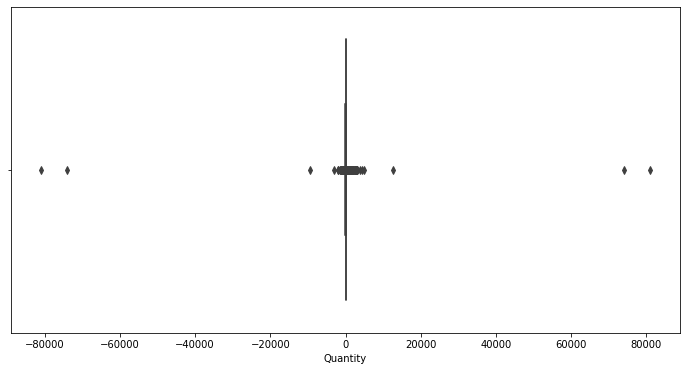

In [12]:
plt.figure(figsize=(12,6))
sns.boxplot(x = df['Quantity']);

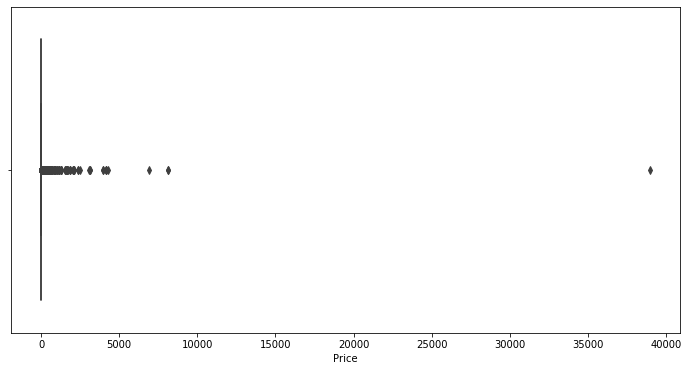

In [413]:
plt.figure(figsize=(12,6))
sns.boxplot(x=df['Price']);

### Aykiri gozlemleri baskilama - Deger atama 

In [16]:
Q1 = df['Price'].quantile(0.01)
Q3 = df['Price'].quantile(0.99)

IQR = Q3-Q1

upper = Q3 + 1.5*IQR
lower = 0 #Q1 - 1.5*IQR

In [17]:
upper

37.185

In [18]:
lower

0

In [20]:
df['Price'] > upper

0         False
1         False
2         False
3         False
4         False
5         False
6         False
7         False
8         False
9         False
10        False
11        False
12        False
13        False
14        False
15        False
16        False
17        False
18        False
19        False
20        False
21        False
22        False
23        False
24        False
25        False
26        False
27        False
28        False
29        False
30        False
31        False
32        False
33        False
34        False
35        False
36        False
37        False
38        False
39        False
40        False
41        False
42        False
43        False
44        False
45        False
46        False
47        False
48        False
49        False
50        False
51        False
52        False
53        False
54        False
55        False
56        False
57        False
58        False
59        False
60        False
61        False
62      

In [21]:
df[df['Price'] > upper ].head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
246,536392,22827,RUSTIC SEVENTEEN DRAWER SIDEBOARD,1,2010-12-01 10:29:00,165.00,13705.00,United Kingdom
1423,536540,C2,CARRIAGE,1,2010-12-01 14:05:00,50.00,14911.00,EIRE
3790,536676,21769,VINTAGE POST OFFICE CABINET,1,2010-12-02 12:18:00,79.95,16752.00,United Kingdom
4989,536835,22655,VINTAGE RED KITCHEN CABINET,1,2010-12-02 18:06:00,295.00,13145.00,United Kingdom
5325,536858,POST,POSTAGE,2,2010-12-03 10:36:00,40.00,13520.00,Switzerland


In [320]:
df[df['Price'] > upper ] =  upper 

In [22]:
df[df['Price'] < lower ] = 0 

### Aykiri gozlemleri silme

In [33]:
# Aykiri gozlemleri silme
for feature in ["Quantity","Price"]:
    Q1 = df[feature].quantile(0.01)
    Q3 = df[feature].quantile(0.99)
    IQR = Q3-Q1
    upper = Q3 + 1.5*IQR
    lower = Q1 - 1.5*IQR
    
    if df[(df[feature] > upper) | (df[feature] < lower)].any(axis=None):
        print(feature,"yes")
        print(df[(df[feature] > upper) | (df[feature] < lower)].shape[0])
    else:
        print(feature, "no")
        
        
    df = df[~((df[feature] > upper) | (df[feature] < lower))]
    

Quantity yes
948
Price yes
846


In [34]:
len(df[((df[feature] > upper) | (df[feature] < lower))])

0

### Invoice

In [35]:
df['Invoice'].value_counts().head()
len(df['Invoice'].value_counts())

21747

* There are 21747 diffrent invoices.
* Invoices with the most products:
    
    576339 -> 542 transactions
    
    579196 -> 533 transactions
    
    580727 -> 529 transactions

In [36]:
# Geri iade edilen urun sayisi 
len(df[df['Invoice'].str.contains('C',na=False)])

8629

## Transform ve agg arasindaki fark. 

In [41]:
df.groupby(['Invoice'])['Invoice'].transform('count').head(20)

0      7
1      7
2      7
3      7
4      7
5      7
6      7
7      2
8      2
9      4
10     4
11     4
12     4
13    12
14    12
15    12
16    12
17    12
18    12
19    12
Name: Invoice, dtype: int64

In [419]:
df.groupby(['Invoice']).agg({'Invoice':'count'})['Invoice'].head(10)

Invoice
536365     7
536366     2
536367    12
536368     4
536369     1
536370    20
536371     1
536372     2
536373    16
536374     1
Name: Invoice, dtype: int64

In [38]:
#bir faturada bulunan urun sayisi ?
df['InvoiceProductCount'] = df.groupby(['Invoice'])['Invoice'].transform('count')#.agg({'Invoice':'count'})['Invoice']

In [43]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35


In [42]:
# bir kisinin toplam kac faturasi var?
df['InvoiceCount'] =df.groupby(['Customer ID'])['Invoice'].transform(lambda x: x.nunique())

# SORU 1 : Bir kisinin aldigi toplam urun sayisi ???
# ODEV 1 : Aldigi urunlerin ortalama fiyati  ?
# ODEV 2 : groupby islemlerinde agg ve transform arasindaki fark ? 

In [422]:
df.head(30)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.00,United Kingdom,7,35
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.00,United Kingdom,7,35
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35
9,536368,22960,JAM MAKING SET WITH JARS,6,2010-12-01 08:34:00,4.25,13047.00,United Kingdom,4,18


In [46]:
# Bir kisinin aldigi toplam urun sayisi 
df['nPurchasedProducts'] = df.groupby(['Customer ID'])['Quantity'].transform(lambda x : x.sum())

In [47]:
df.head(40)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35,1693
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35,1693
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.00,United Kingdom,7,35,1693
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.00,United Kingdom,7,35,1693
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693
9,536368,22960,JAM MAKING SET WITH JARS,6,2010-12-01 08:34:00,4.25,13047.00,United Kingdom,4,18,1355


In [427]:
len(df[df['Customer ID']==17850]['Invoice'].unique())

35

#### StockCode

In [48]:
df['StockCode'].value_counts().sort_values(ascending=False) # BANK CHARGES POST, PADS, CRUK , CT, DOT, 

85123A          2064
22423           1905
85099B          1653
47566           1416
84879           1414
20725           1359
22720           1231
20727           1126
23203           1111
22383           1103
22197           1094
21212           1070
23209           1040
23298           1036
POST            1035
22086           1026
22382           1021
20728           1012
22457            996
22469            988
22384            977
22960            974
21034            955
22727            928
23206            907
82482            904
22993            902
22386            900
22138            893
22666            887
22961            885
20726            861
22699            853
22139            849
23084            848
22178            847
82494L           836
22726            831
22470            829
20914            817
22411            814
21931            800
23202            788
23301            779
23201            774
20724            767
23245            763
22697        

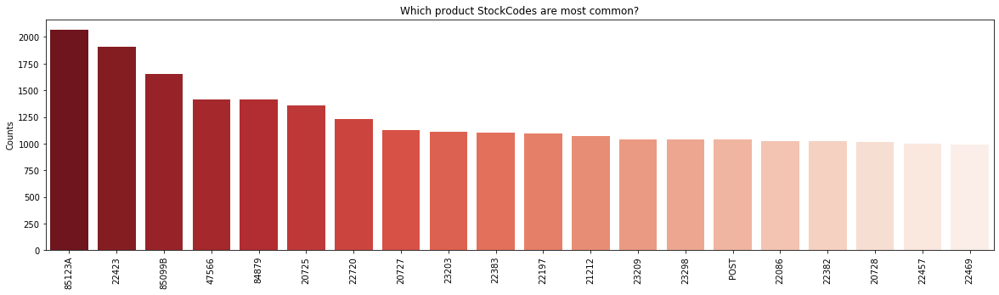

In [432]:
stockcode_counts = df['StockCode'].value_counts().sort_values(ascending=False).iloc[0:20]

plt.figure(figsize=(20,5))
sns.barplot(stockcode_counts.index, stockcode_counts.values, palette="Reds_r")
plt.ylabel("Counts")
plt.title("Which product StockCodes are most common?");
plt.xticks(rotation=90);

In [433]:
# df[df['StockCode']=='D']

In [49]:
#df[df['StockCode']=='BANK CHARGES']

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts
4406,536779,BANK CHARGES,Bank Charges,1,2010-12-02 15:08:00,15.00,15823.00,United Kingdom,1,2,-283
62508,541505,BANK CHARGES,Bank Charges,1,2011-01-18 15:58:00,15.00,15939.00,United Kingdom,1,15,3813
152966,549717,BANK CHARGES,Bank Charges,1,2011-04-11 14:56:00,15.00,14606.00,United Kingdom,1,128,5975
175275,551945,BANK CHARGES,Bank Charges,1,2011-05-05 11:09:00,15.00,16714.00,United Kingdom,1,3,608
327921,565735,BANK CHARGES,Bank Charges,1,2011-09-06 12:25:00,15.00,16904.00,United Kingdom,1,16,2033
361740,568375,BANK CHARGES,Bank Charges,1,2011-09-26 17:01:00,15.00,13405.00,United Kingdom,2,3,165
361741,568375,BANK CHARGES,Bank Charges,1,2011-09-26 17:01:00,0.00,13405.00,United Kingdom,2,3,165
407618,571900,BANK CHARGES,Bank Charges,1,2011-10-19 14:26:00,15.00,13263.00,United Kingdom,1,35,4780
431363,573586,BANK CHARGES,Bank Charges,1,2011-10-31 14:48:00,15.00,14704.00,United Kingdom,1,9,1082
440745,574546,BANK CHARGES,Bank Charges,1,2011-11-04 14:59:00,15.00,13651.00,United Kingdom,1,2,33


In [435]:
#df[df['StockCode']=='PADS']

In [436]:
df = df[~(df['StockCode'].isin(['BANK CHARGES', 'POST','M' ,'D','PADS', 'CRUK' , 'DOT']))]

In [437]:
df.shape

(403611, 11)

# SORU 2 : Yukarida ki degerleri kod yazarak  bulmak. 

In [582]:
dir(str)

['__add__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getnewargs__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rmod__',
 '__rmul__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'capitalize',
 'casefold',
 'center',
 'count',
 'encode',
 'endswith',
 'expandtabs',
 'find',
 'format',
 'format_map',
 'index',
 'isalnum',
 'isalpha',
 'isascii',
 'isdecimal',
 'isdigit',
 'isidentifier',
 'islower',
 'isnumeric',
 'isprintable',
 'isspace',
 'istitle',
 'isupper',
 'join',
 'ljust',
 'lower',
 'lstrip',
 'maketrans',
 'partition',
 'replace',
 'rfind',
 'rindex',
 'rjust',
 'rpartition',
 'rsplit',
 'rstrip',
 'split',
 'splitlines',
 'startswith',
 'strip',
 'swapcase',
 'title',
 'translate',
 'upper',


In [51]:
len(df[df['StockCode'].isnull()])

0

In [52]:
len(df[df['StockCode']=='NA'])

0

In [53]:
df['StockCode'].head(50)

0     85123A
1      71053
2     84406B
3     84029G
4     84029E
5      22752
6      21730
7      22633
8      22632
9      22960
10     22913
11     22912
12     22914
13     84879
14     22745
15     22748
16     22749
17     22310
18     84969
19     22623
20     22622
21     21754
22     21755
23     21777
24     48187
25     21756
26     22728
27     22727
28     22726
29     21724
30     21883
31     10002
32     21791
33     21035
34     22326
35     22629
36     22659
37     22631
38     22661
39     21731
40     22900
41     21913
42     22540
43     22544
44     22492
45      POST
46     22086
47     22632
48     22633
49    85123A
Name: StockCode, dtype: object

In [279]:
df['StockCode'].str.isalpha().head(50)

0     False
1       NaN
2     False
3     False
4     False
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
21      NaN
22      NaN
23      NaN
24      NaN
25      NaN
26      NaN
27      NaN
28      NaN
29      NaN
30      NaN
31      NaN
32      NaN
33      NaN
34      NaN
35      NaN
36      NaN
37      NaN
38      NaN
39      NaN
40      NaN
41      NaN
42      NaN
43      NaN
44      NaN
45     True
46      NaN
47      NaN
48      NaN
49    False
Name: StockCode, dtype: object

In [54]:
df['StockCode'].str.isalnum().unique()#head()

array([True, nan, False], dtype=object)

In [56]:
df['StockCode'].str.isnumeric().head(10) # Arastir ???

0    False
1      NaN
2    False
3    False
4    False
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
Name: StockCode, dtype: object

In [51]:
list(df[df['StockCode'].str.isalpha()==True]['StockCode'].unique())

['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

In [62]:
df[(df['StockCode'].str.isalpha()==True) | (df['StockCode'].str.isspace()==True)]['StockCode'].unique()

array([], dtype=object)

In [57]:
#Finally :) 
rare_stockcode_list = df[(df['StockCode'].str.isalpha()==True) | (df['StockCode'].str.contains(' '))]['StockCode'].unique()
rare_stockcode_list

array(['POST', 'D', 'M', 'BANK CHARGES', 'PADS', 'DOT', 'CRUK'],
      dtype=object)

In [58]:
df = df[~(df['StockCode'].isin(rare_stockcode_list))]

### Description

In [59]:
df["Description"].nunique()

3874

In [60]:
df['Description'].value_counts().head()

WHITE HANGING HEART T-LIGHT HOLDER    2057
REGENCY CAKESTAND 3 TIER              1905
JUMBO BAG RED RETROSPOT               1653
PARTY BUNTING                         1416
ASSORTED COLOUR BIRD ORNAMENT         1414
Name: Description, dtype: int64

In [61]:
 df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35,1693
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35,1693
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693


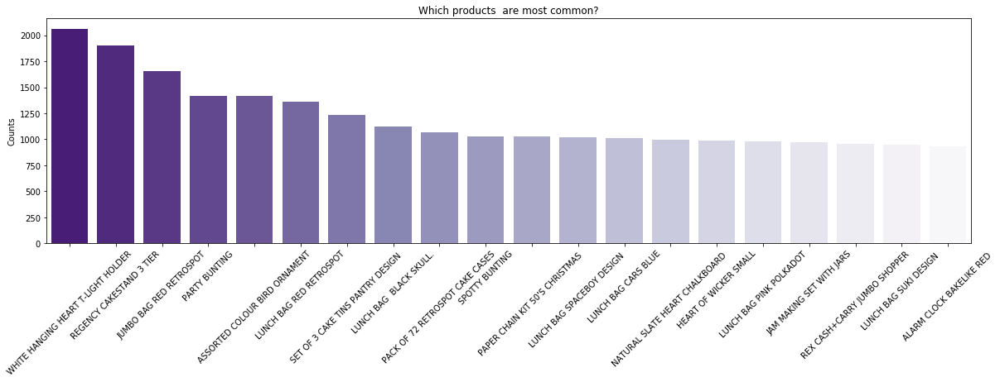

In [441]:
# barh dene
description_counts = df['Description'].value_counts().sort_values(ascending=False).iloc[0:20]

plt.figure(figsize=(20,5))
sns.barplot(description_counts.index, description_counts.values, palette="Purples_r")
plt.ylabel("Counts")
plt.title("Which products  are most common?");
plt.xticks(rotation=45);

In [62]:
# En cok satilan urunler
df.groupby("Description").agg({"Quantity":"sum"}).sort_values("Quantity", ascending = False).head()

,Quantity
Description,
JUMBO BAG RED RETROSPOT,40166
WORLD WAR 2 GLIDERS ASSTD DESIGNS,30271
ASSORTED COLOUR BIRD ORNAMENT,29946
WHITE HANGING HEART T-LIGHT HOLDER,27575
PACK OF 72 RETROSPOT CAKE CASES,25249


# SORU 3: En cok geri iade edilen urunler

In [63]:
# En cok geri iade edilen urunler
df[df['Quantity']<0].groupby(['Description', 'StockCode']).agg({'Quantity' : 'sum'}).sort_values("Quantity", ascending = True).head()

,,Quantity
Description,StockCode,
REGENCY CAKESTAND 3 TIER,22423,-857
JUMBO BAG RED RETROSPOT,85099B,-815
LUNCH BAG RED RETROSPOT,20725,-552
JUMBO BAG APPLES,23199,-523
PAPER CHAIN KIT 50'S CHRISTMAS,22086,-453


### Quantity

In [443]:
df['Quantity'].nunique()

252

In [444]:
df.sort_values('Quantity',ascending=False).head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts
254597,559322,85099B,JUMBO BAG RED RETROSPOT,300,2011-07-07 14:46:00,1.79,15769.00,United Kingdom,7,27,18380
34301,539331,20733,GOLD MINI TAPE MEASURE,300,2010-12-17 09:39:00,0.72,16013.00,United Kingdom,1,45,9325
221532,556255,48188,DOORMAT WELCOME PUPPIES,300,2011-06-09 17:27:00,4.58,18102.00,United Kingdom,12,58,40308
221531,556255,48173C,DOORMAT BLACK FLOCK,300,2011-06-09 17:27:00,4.58,18102.00,United Kingdom,12,58,40308
221530,556255,48138,DOORMAT UNION FLAG,300,2011-06-09 17:27:00,4.58,18102.00,United Kingdom,12,58,40308


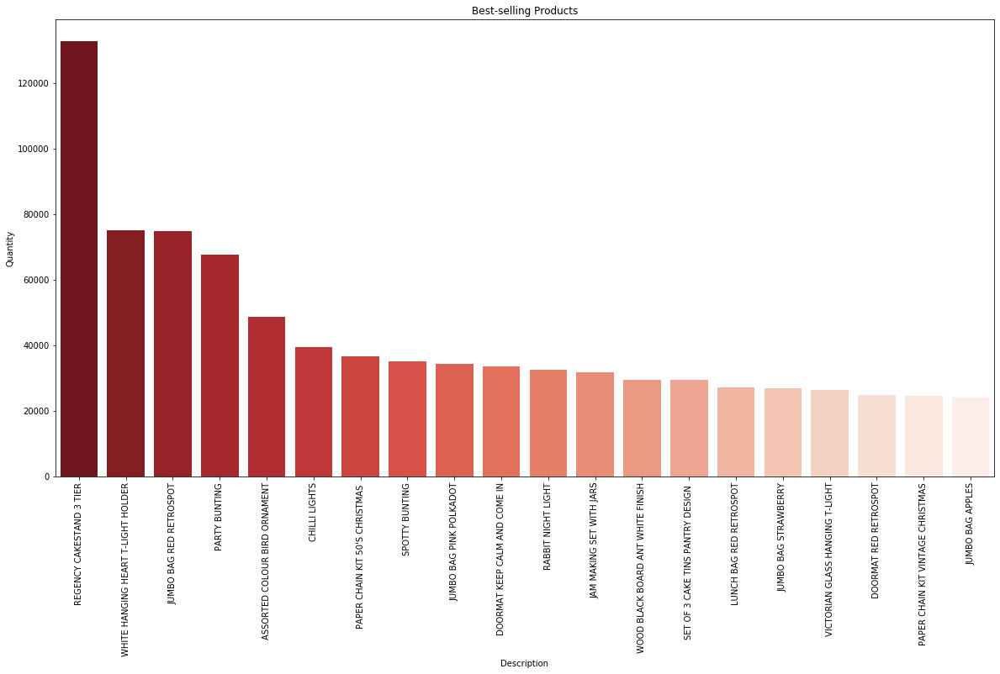

In [445]:
best_selling_products = df.groupby('Description')['Quantity'].sum().sort_values(ascending=False).iloc[0:20]

plt.figure(figsize=(20,10))
sns.barplot(products_incomes.index, products_incomes.values, palette="Reds_r")
plt.ylabel("Quantity")
plt.title("Best-selling Products");
plt.xticks(rotation=90);

### InvoiceDate	

In [64]:
import datetime as dt

In [65]:
oldest_date = df['InvoiceDate'].min()
oldest_date

Timestamp('2010-12-01 08:26:00')

In [66]:
newest_date = df['InvoiceDate'].max() 
newest_date

Timestamp('2011-12-09 12:50:00')

In [449]:
df.head(10)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35,1693
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35,1693
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.00,United Kingdom,7,35,1693
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.00,United Kingdom,7,35,1693
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693
9,536368,22960,JAM MAKING SET WITH JARS,6,2010-12-01 08:34:00,4.25,13047.00,United Kingdom,4,18,1355


In [72]:
df['Invoice_Month'] = df['InvoiceDate'].dt.month.astype(str)
df['Invoice_Hour'] = df['InvoiceDate'].dt.hour.astype(str)
df['Invoice_Day'] = df['InvoiceDate'].dt.dayofweek.astype(str)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

In [73]:
df['Invoice_Day'].unique()

array(['2', '3', '4', '6', '0', '1'], dtype=object)

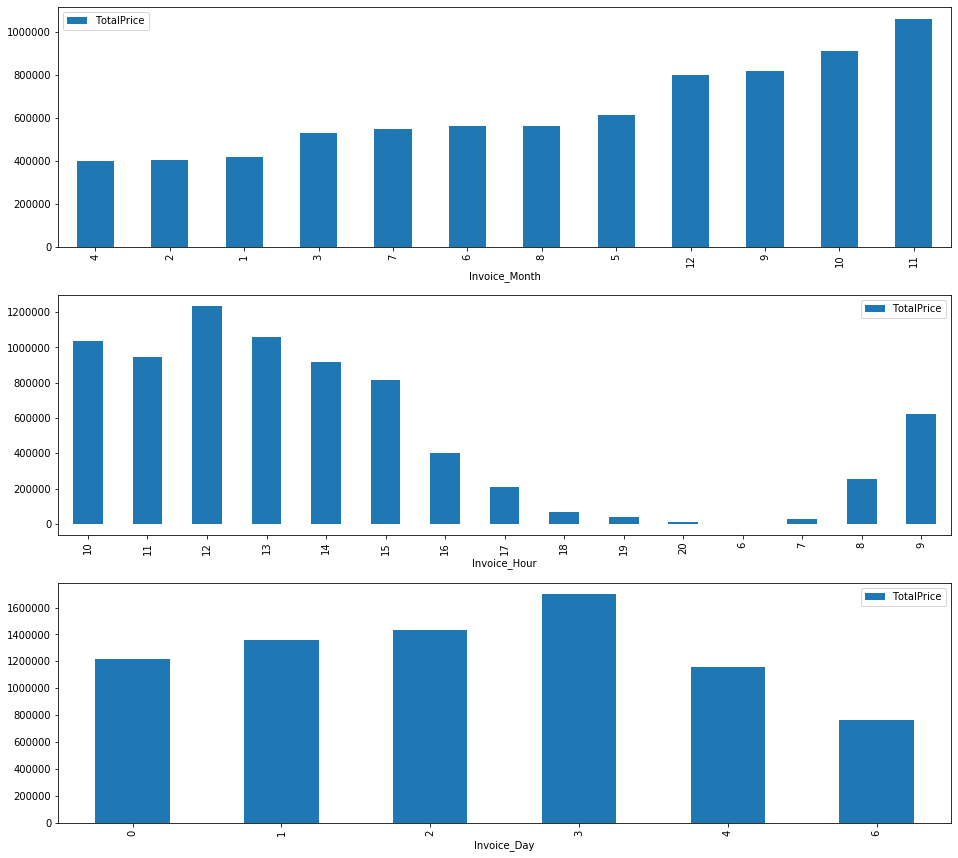

In [74]:
fig,ax = plt.subplots(3, 1, figsize=(16,15))

df.groupby('Invoice_Month')['TotalPrice'].sum().sort_values().to_frame().plot.bar(ax=ax[0])
df.groupby('Invoice_Hour')['TotalPrice'].sum().to_frame().plot.bar(ax=ax[1])
df.groupby('Invoice_Day')['TotalPrice'].sum().to_frame().plot.bar(ax=ax[2])

### Price

In [75]:
df.sort_values('Price',ascending=False).head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts,Invoice_Month,Invoice_Hour,Invoice_Day,TotalPrice,TotalBill
356253,568048,22824,3 TIER SWEETHEART GARDEN SHELF,1,2011-09-23 12:36:00,35.95,14911.00,EIRE,66,242,76824,9,12,4,35.95,1261.09
97829,544657,22824,3 TIER SWEETHEART GARDEN SHELF,1,2011-02-22 13:08:00,35.95,14895.00,United Kingdom,118,24,4823,2,13,1,35.95,2346.34
293725,562612,22824,3 TIER SWEETHEART GARDEN SHELF,1,2011-08-08 12:00:00,35.95,16637.00,United Kingdom,16,5,891,8,12,0,35.95,226.93
232423,557319,22824,3 TIER SWEETHEART GARDEN SHELF,1,2011-06-20 08:23:00,35.95,15076.00,United Kingdom,49,1,571,6,8,0,35.95,880.85
296102,562847,22824,3 TIER SWEETHEART GARDEN SHELF,1,2011-08-10 09:34:00,35.95,16245.00,United Kingdom,21,5,1008,8,9,2,35.95,315.72


In [76]:
df.sort_values('Price',ascending=False).tail()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts,Invoice_Month,Invoice_Hour,Invoice_Day,TotalPrice,TotalBill
314748,564651,21786,POLKADOT RAIN HAT,144,2011-08-26 14:19:00,0.00,14646.00,Netherlands,4,72,173724,8,14,4,0.00,0.00
86789,543599,84535B,FAIRY CAKES NOTEBOOK A6 SIZE,16,2011-02-10 13:08:00,0.00,17560.00,United Kingdom,1,5,651,2,13,3,0.00,0.00
479079,577129,22464,HANGING METAL HEART LANTERN,4,2011-11-17 19:52:00,0.00,15602.00,United Kingdom,2,15,1001,11,19,3,0.00,46.80
198383,554037,22619,SET OF 6 SOLDIER SKITTLES,80,2011-05-20 14:13:00,0.00,12415.00,Australia,4,24,64066,5,14,4,0.00,766.36
420404,572893,21208,PASTEL COLOUR HONEYCOMB FAN,5,2011-10-26 14:36:00,0.00,18059.00,United Kingdom,8,4,258,10,14,2,0.00,95.78


In [77]:
#df['TotalPrice'] =  df.apply(lambda row: row['Price'] * row['Quantity'], axis=1)
# Faturadaki tek bir cesit urunun toplam fiyati(faturanin kalemleri???)
df['TotalPrice'] = df['Quantity'] * df['Price']
# Faturanin toplam tutari 
df['TotalBill']= df.groupby(['Invoice'])['TotalPrice'].transform('sum')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [78]:
df.sort_values('TotalBill',ascending = False).head(10)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts,Invoice_Month,Invoice_Hour,Invoice_Day,TotalPrice,TotalBill
411230,572209,23554,LANDMARK FRAME OXFORD STREET,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
411229,572209,23556,LANDMARK FRAME COVENT GARDEN,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
411231,572209,23555,LANDMARK FRAME NOTTING HILL,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
411232,572209,23558,LANDMARK FRAME LONDON BRIDGE,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
411233,572209,23485,BOTANICAL GARDENS WALL CLOCK,120,2011-10-21 12:08:00,20.80,18102.00,United Kingdom,7,58,40308,10,12,4,2496.00,22206.00
411234,572209,23553,LANDMARK FRAME CAMDEN TOWN,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
411235,572209,23557,LANDMARK FRAME BAKER STREET,300,2011-10-21 12:08:00,10.95,18102.00,United Kingdom,7,58,40308,10,12,4,3285.00,22206.00
228191,556917,23154,SET OF 4 JAM JAR MAGNETS,120,2011-06-15 13:37:00,1.85,12415.00,Australia,135,24,64066,6,13,2,222.00,22187.13
228193,556917,23084,RABBIT NIGHT LIGHT,240,2011-06-15 13:37:00,1.79,12415.00,Australia,135,24,64066,6,13,2,429.60,22187.13
228194,556917,23108,SET OF 10 LED DOLLY LIGHTS,48,2011-06-15 13:37:00,5.39,12415.00,Australia,135,24,64066,6,13,2,258.72,22187.13


In [461]:
df.head(10)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts,Invoice_Month,Invoice_Hour,Invoice_Day,TotalPrice,TotalBill
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,7,35,1693,12,8,2,15.30,139.12
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693,12,8,2,20.34,139.12
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,7,35,1693,12,8,2,22.00,139.12
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693,12,8,2,20.34,139.12
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,7,35,1693,12,8,2,20.34,139.12
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.00,United Kingdom,7,35,1693,12,8,2,15.30,139.12
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.00,United Kingdom,7,35,1693,12,8,2,25.50,139.12
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693,12,8,2,11.10,22.20
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.00,United Kingdom,2,35,1693,12,8,2,11.10,22.20
9,536368,22960,JAM MAKING SET WITH JARS,6,2010-12-01 08:34:00,4.25,13047.00,United Kingdom,4,18,1355,12,8,2,25.50,70.05


# SORU 4 : En cok getirisi olan 10 urunu gorsellestiriniz.

In [462]:
income_from_products = df.groupby('Description')['TotalPrice'].sum().sort_values(ascending=False).iloc[0:10]
income_from_products

Description
REGENCY CAKESTAND 3 TIER             132870.40
WHITE HANGING HEART T-LIGHT HOLDER    75054.33
JUMBO BAG RED RETROSPOT               74786.76
PARTY BUNTING                         67687.53
ASSORTED COLOUR BIRD ORNAMENT         48715.62
CHILLI LIGHTS                         39562.41
PAPER CHAIN KIT 50'S CHRISTMAS        36522.88
SPOTTY BUNTING                        35056.44
JUMBO BAG PINK POLKADOT               34248.01
DOORMAT KEEP CALM AND COME IN         33438.60
Name: TotalPrice, dtype: float64

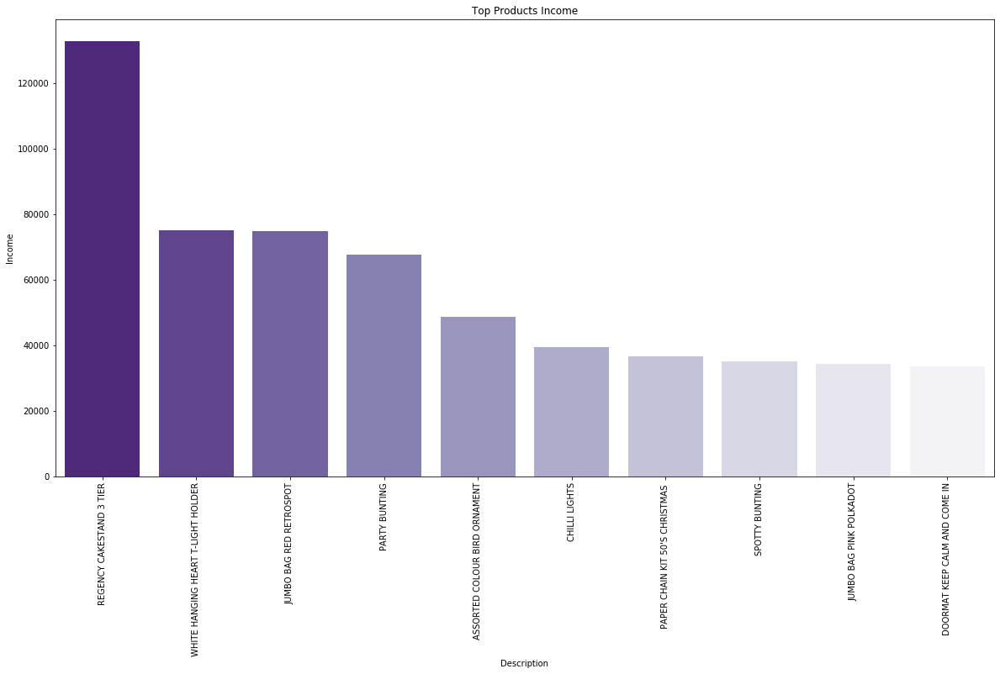

In [463]:
plt.figure(figsize=(20,10))
sns.barplot(income_from_products.index, income_from_products.values, palette="Purples_r")
plt.ylabel("Income")
plt.title("Top Products Income");
plt.xticks(rotation=90);

### Customer ID

In [79]:
df["Customer ID"] = df["Customer ID"].astype(int)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [80]:
# En fazla harcama yapan musteriler
df.groupby('Customer ID').agg({'TotalPrice':'sum'}).sort_values('TotalPrice',ascending=False).head()

,TotalPrice
Customer ID,
14646,251025.06
18102,186480.82
14911,129402.47
12415,112497.86
14156,109077.32


### Country

In [466]:
#hangi ulkeden kac siparis geldi?
df["Country"].value_counts()

United Kingdom          360133
Germany                   9091
France                    8164
EIRE                      7356
Spain                     2458
Netherlands               2284
Belgium                   1970
Switzerland               1844
Portugal                  1436
Australia                 1230
Norway                    1059
Italy                      782
Channel Islands            752
Finland                    653
Cyprus                     610
Sweden                     415
Austria                    387
Denmark                    375
Japan                      337
Poland                     335
USA                        291
Israel                     248
Unspecified                244
Singapore                  213
Iceland                    182
Canada                     149
Greece                     141
Malta                      123
United Arab Emirates        67
European Community          58
RSA                         57
Lebanon                     45
Lithuani

In [467]:
#hangi ulke ne kadar kazandırdı?
df.groupby("Country").agg({"TotalPrice":"sum"}).sort_values("TotalPrice", ascending = False).head()

,TotalPrice
Country,
United Kingdom,6246257.48
Netherlands,255686.63
EIRE,242693.25
Germany,200260.74
France,178905.45


# RFM Analysis

Recency, Frequency, Monetary ifadelerinin baş harflerinden oluşur.

Müşterilerin satın alma alışkanlıkları üzerinden pazarlama ve satış stratejileri belirlemeye yardımcı olan bir tekniktir.

- Recency (yenilik): Müşterinin son satın almasından bugüne kadar geçen süre

    -- Diğer bir ifadesiyle “Müşterinin son temasından bugüne kadar geçen süre” dir.

    -- Bugünün tarihi - Son satın alma

    -- Örnek verecek olursak bugün bu analizi yapıyorsak bugünün tarihi - son 	ürün satın alma tarihi.

    -- Bu örneğin 20 olabilir 100 olabilir. Biliriz ki 20 olan müşteri daha sıcaktır. Daha son zamanlarda bizimle teması olmuştur.

- Frequency (Sıklık): Toplam satın alma sayısı.

- Monetary (Parasal Değer): Müşterinin yaptığı toplam harcama.


### Recency

In [81]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,InvoiceProductCount,InvoiceCount,nPurchasedProducts,Invoice_Month,Invoice_Hour,Invoice_Day,TotalPrice,TotalBill
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,7,35,1693,12,8,2,15.30,139.12
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,7,35,1693,12,8,2,20.34,139.12
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,7,35,1693,12,8,2,22.00,139.12
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,7,35,1693,12,8,2,20.34,139.12
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,7,35,1693,12,8,2,20.34,139.12


In [83]:
df['InvoiceDate'].max() 

Timestamp('2011-12-09 12:50:00')

In [84]:
import datetime as dt
now = dt.datetime(2011,12,9)
now

datetime.datetime(2011, 12, 9, 0, 0)

In [85]:
recency = df.groupby('Customer ID', as_index=False).agg({'InvoiceDate': lambda x: (now - x.max()).days})

In [86]:
recency.head()

,Customer ID,InvoiceDate
0,12347,1
1,12348,74
2,12349,17
3,12350,309
4,12352,35


### Frequency

In [88]:
frequency = df.groupby(['Customer ID'], as_index=False).agg({'Invoice':lambda x: len(x.unique())})

In [89]:
frequency.head()

,Customer ID,Invoice
0,12347,7
1,12348,4
2,12349,1
3,12350,1
4,12352,8


### Monetary

In [93]:
monetary = df.groupby("Customer ID", as_index=False).agg({"TotalPrice":"sum"})

In [94]:
monetary.head()

,Customer ID,TotalPrice
0,12347,4310.00
1,12348,1437.24
2,12349,1417.60
3,12350,294.40
4,12352,1265.41


In [95]:
rfm = recency.merge(frequency,on='Customer ID').merge(monetary,on='Customer ID')
rfm.head()

,Customer ID,InvoiceDate,Invoice,TotalPrice
0,12347,1,7,4310.00
1,12348,74,4,1437.24
2,12349,17,1,1417.60
3,12350,309,1,294.40
4,12352,35,8,1265.41


In [96]:
rfm.rename(columns={'InvoiceDate': 'Recency', 
                    'Invoice': 'Frequency',
                    'TotalPrice': 'Monetary'}, inplace=True)

In [97]:
rfm.head()

,Customer ID,Recency,Frequency,Monetary
0,12347,1,7,4310.00
1,12348,74,4,1437.24
2,12349,17,1,1417.60
3,12350,309,1,294.40
4,12352,35,8,1265.41


### Scoring R-F-M values

In [104]:
pd.qcut(rfm['Frequency'],6,duplicates='drop').value_counts()

In [100]:
# pd.qcut(rfm['Recency'],5).value_counts()

(-1.001, 10.0]    894
(69.0, 178.0]     874
(178.0, 372.0]    862
(30.0, 69.0]      856
(10.0, 30.0]      856
Name: Recency, dtype: int64

In [105]:
rfm["RecencyScore"] = pd.qcut(rfm['Recency'], 5, labels = [5, 4, 3, 2, 1])

In [106]:
rfm["FrequencyScore"] = pd.qcut(rfm['Frequency'], 6,duplicates='drop', labels = [1, 2, 3, 4,5])

In [107]:
rfm["MonetaryScore"] = pd.qcut(rfm['Monetary'], 5, labels = [1, 2, 3, 4, 5])

In [108]:
rfm["RFM_SCORE"] = rfm['RecencyScore'].astype(str) + rfm['FrequencyScore'].astype(str) + rfm['MonetaryScore'].astype(str)

In [486]:
rfm.head(40)

,Customer ID,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE
0,12347,1,7,4310.00,5,4,5,545
1,12348,74,4,1437.24,2,3,4,234
2,12349,17,1,1417.60,4,1,4,414
3,12350,309,1,294.40,1,1,2,112
4,12352,35,8,1265.41,3,5,4,354
5,12353,203,1,89.00,1,1,1,111
6,12354,231,1,1079.40,1,1,4,114
7,12355,213,1,459.40,1,1,3,113
8,12356,21,3,2487.43,4,2,5,425
9,12357,32,1,6207.67,3,1,5,315


In [109]:
rfm.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer ID,4342.00,15298.17,1721.37,12347.00,13813.25,15296.50,16776.75,18287.00
Recency,4342.00,90.72,100.93,-1.00,15.00,49.00,142.00,372.00
Frequency,4342.00,4.96,9.02,1.00,1.00,3.00,5.00,242.00
Monetary,4342.00,1759.13,6838.19,-1192.20,287.66,637.01,1548.11,251025.06


In [488]:
rfm[rfm["RFM_SCORE"] == "555"].head()

,Customer ID,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE
14,12362,2,13,4665.58,5,5,5,555
55,12417,2,12,3155.80,5,5,5,555
74,12437,0,19,4392.66,5,5,5,555
99,12471,1,45,16358.92,5,5,5,555
104,12476,0,20,5628.58,5,5,5,555


In [489]:
rfm[rfm["RFM_SCORE"] == "111"].head()

,Customer ID,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE
5,12353,203,1,89.00,1,1,1,111
13,12361,286,1,174.90,1,1,1,111
42,12401,302,1,69.30,1,1,1,111
43,12402,322,1,195.60,1,1,1,111
76,12441,365,1,155.55,1,1,1,111


## Customer Segmentetion

In [490]:
seg_map = {
    r'[1-2][1-2]': 'Hibernating',
    r'[1-2][3-4]': 'At Risk',
    r'[1-2]5': 'Can\'t Loose',
    r'3[1-2]': 'About to Sleep',
    r'33': 'Need Attention',
    r'[3-4][4-5]': 'Loyal Customers',
    r'41': 'Promising',
    r'51': 'New Customers',
    r'[4-5][2-3]': 'Potential Loyalists',
    r'5[4-5]': 'Champions'
}

In [491]:
rfm['RF_Score'] = rfm['RecencyScore'].astype(str) + rfm['FrequencyScore'].astype(str)


rfm['RF_Segment'] = rfm['RF_Score'].replace(seg_map, regex=True)
rfm.head()

,Customer ID,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE,RF_Score,RF_Segment
0,12347,1,7,4310.00,5,4,5,545,54,Champions
1,12348,74,4,1437.24,2,3,4,234,23,At Risk
2,12349,17,1,1417.60,4,1,4,414,41,Promising
3,12350,309,1,294.40,1,1,2,112,11,Hibernating
4,12352,35,8,1265.41,3,5,4,354,35,Loyal Customers


In [492]:
rfm[rfm["RF_Segment"] == "Need Attention"].index

Int64Index([  19,   52,   69,   90,  101,  182,  325,  387,  420,  425,  461,
             541,  607,  614,  730,  929, 1122, 1234, 1346, 1422, 1481, 1590,
            1614, 1835, 1888, 1903, 1925, 1939, 2083, 2095, 2190, 2250, 2260,
            2298, 2383, 2435, 2474, 2492, 2509, 2511, 2542, 2556, 2562, 2566,
            2568, 2569, 2649, 2684, 2691, 2715, 2802, 2826, 2838, 2853, 3027,
            3046, 3130, 3138, 3216, 3218, 3306, 3446, 3484, 3534, 3634, 3675,
            3714, 3821, 3834, 3897, 3938, 3989, 4000, 4077, 4100, 4189, 4229],
           dtype='int64')

In [493]:
rfm['RM_Score'] = rfm['RecencyScore'].astype(str) + rfm['MonetaryScore'].astype(str)


rfm['RM_Segment'] = rfm['RM_Score'].replace(seg_map, regex=True)
rfm.head()

,Customer ID,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE,RF_Score,RF_Segment,RM_Score,RM_Segment
0,12347,1,7,4310.00,5,4,5,545,54,Champions,55,Champions
1,12348,74,4,1437.24,2,3,4,234,23,At Risk,24,At Risk
2,12349,17,1,1417.60,4,1,4,414,41,Promising,44,Loyal Customers
3,12350,309,1,294.40,1,1,2,112,11,Hibernating,12,Hibernating
4,12352,35,8,1265.41,3,5,4,354,35,Loyal Customers,34,Loyal Customers


In [494]:
rfm.shape

(4342, 12)

In [495]:
len(rfm[rfm['RM_Segment'] == rfm['RF_Segment']])

2955

In [496]:
# df['Customer ID'].nunique()

In [497]:
new_customers = rfm[rfm['RF_Segment'] == 'New Customers'].index
# need_attention_customers = rfm[rfm['RF_Segment'] == 'Need Attention'].index

In [498]:
new_customers

Int64Index([  10,   18,   77,  106,  151,  167,  192,  231,  244,  248,
            ...
            4070, 4073, 4089, 4094, 4138, 4146, 4172, 4204, 4242, 4258],
           dtype='int64', length=163)

In [499]:
pd.DataFrame(new_customers).to_csv('new_customers.csv')